# K2-18 

In [1]:
import lightkurve as lk
from glob import glob
import ombre as om
import numpy as np
import matplotlib.pyplot as plt
import lightkurve as lk

import astropy.units as u

In [2]:
name = 'K2-18'

In [3]:
fnames = np.asarray(glob(f'/Users/ch/HST/data/{name}/*.fits'))
fnames = np.sort(fnames)
obs = om.Observation.from_files(fnames)

In [4]:
obs

EPIC201912552 [16 Visits]

In [5]:
clc = lk.search_lightcurve(name, mission='K2', author='EVEREST').download()
clc.flux = clc.flux.value * u.electron/u.s
clc.flux_err = clc.flux.value * u.electron/u.s
clc = clc.flatten(51)
clc = clc[clc.flux.value > 0.97]
clc = clc.remove_outliers(sigma_upper=3, sigma_lower=1e2)

In [6]:
k = np.abs(clc.fold(obs.period, obs.t0 - 2454833).time) < 0.5
k = k[np.argsort(clc.fold(obs.period, obs.t0 - 2454833).time_original)]

<AxesSubplot:xlabel='Phase [JD]', ylabel='Flux [$\\mathrm{e^{-}\\,s^{-1}}$]'>

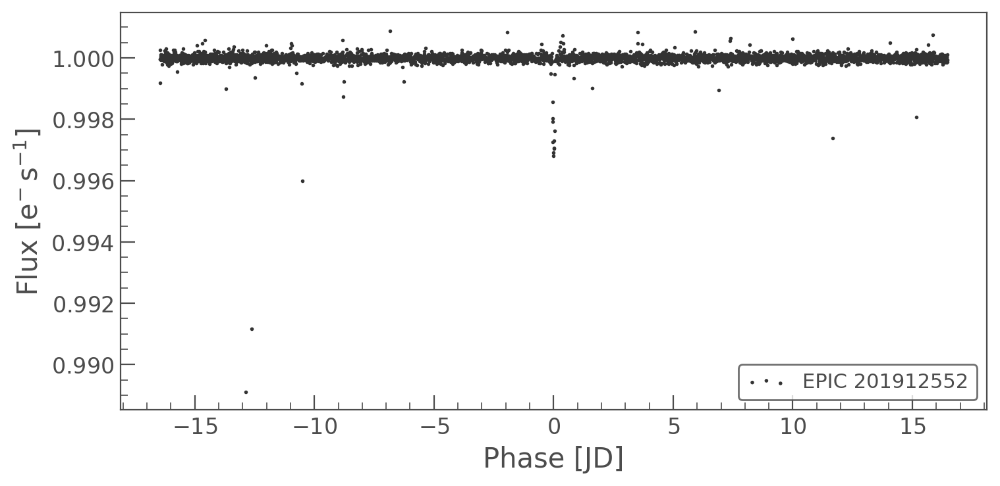

In [7]:
clc.fold(obs.period, obs.t0 - 2454833).scatter()

In [8]:
obs.fit_transit(x_suppl=clc.time.value[k] + 2454833,
                y_suppl=clc.flux.value[k],
                yerr_suppl=clc.flux_err.value[k],
                exptime_suppl=np.median(np.diff(clc.time.value)))

<AxesSubplot:xlabel='Phase', ylabel='$e^-s^{-1}$'>

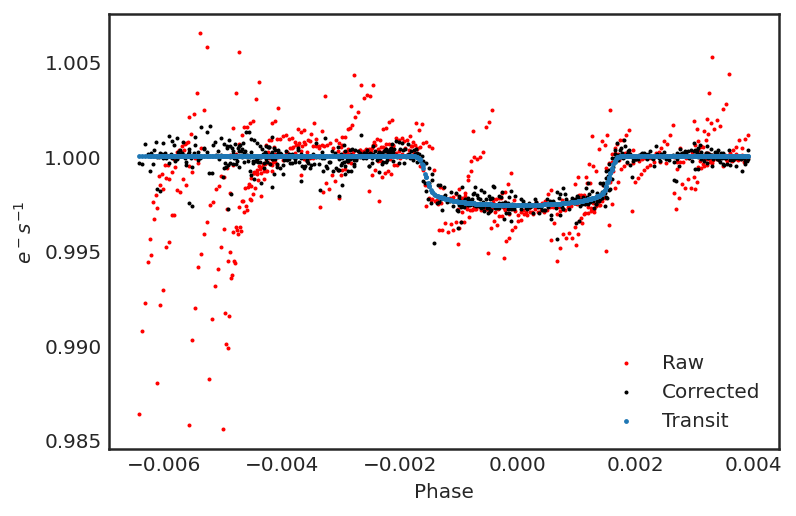

In [9]:
obs.plot()

In [10]:
obs.fit_model()

Fitting Transit/Eclipse Model:   0%|          | 0/16 [00:00<?, ?it/s]

Fitting Transit/Eclipse Model:   6%|▋         | 1/16 [00:13<03:19, 13.29s/it]

Fitting Transit/Eclipse Model:  12%|█▎        | 2/16 [00:26<03:01, 12.96s/it]

Fitting Transit/Eclipse Model:  19%|█▉        | 3/16 [00:38<02:46, 12.84s/it]

Fitting Transit/Eclipse Model:  25%|██▌       | 4/16 [00:51<02:31, 12.66s/it]

Fitting Transit/Eclipse Model:  31%|███▏      | 5/16 [01:03<02:19, 12.67s/it]

Fitting Transit/Eclipse Model:  38%|███▊      | 6/16 [01:14<02:00, 12.04s/it]

Fitting Transit/Eclipse Model:  44%|████▍     | 7/16 [01:28<01:52, 12.49s/it]

Fitting Transit/Eclipse Model:  50%|█████     | 8/16 [01:38<01:33, 11.69s/it]

Fitting Transit/Eclipse Model:  56%|█████▋    | 9/16 [01:49<01:22, 11.74s/it]

Fitting Transit/Eclipse Model:  62%|██████▎   | 10/16 [02:02<01:12, 12.05s/it]

Fitting Transit/Eclipse Model:  69%|██████▉   | 11/16 [02:15<01:01, 12.27s/it]

Fitting Transit/Eclipse Model:  75%|███████▌  | 12/16 [02:26<00:48, 12.06s/it]

Fitting Transit/Eclipse Model:  81%|████████▏ | 13/16 [02:39<00:36, 12.20s/it]

Fitting Transit/Eclipse Model:  88%|████████▊ | 14/16 [02:50<00:23, 11.81s/it]

Fitting Transit/Eclipse Model:  94%|█████████▍| 15/16 [03:02<00:11, 11.97s/it]

Fitting Transit/Eclipse Model: 100%|██████████| 16/16 [03:12<00:00, 11.38s/it]

Fitting Transit/Eclipse Model: 100%|██████████| 16/16 [03:12<00:00, 12.04s/it]

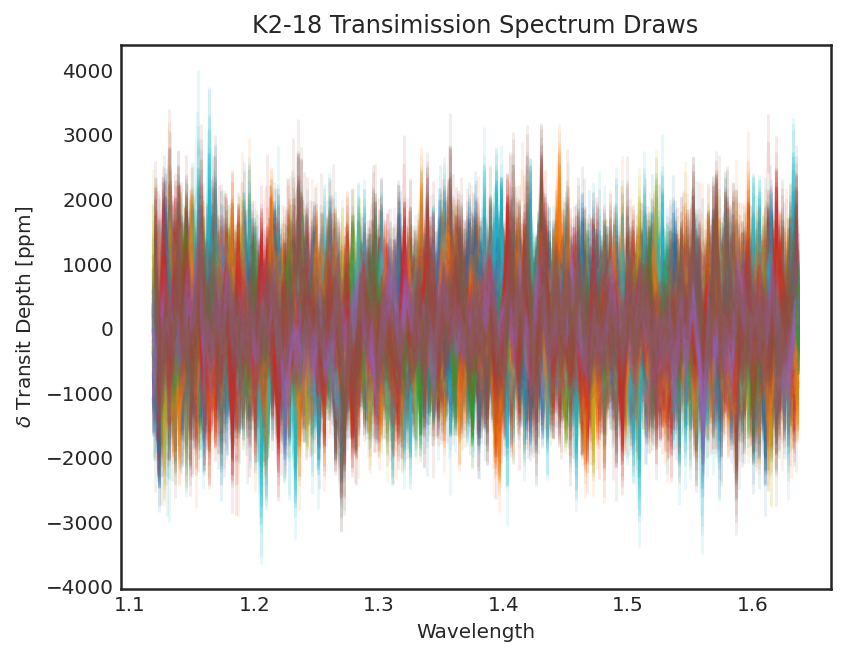

In [11]:
obs.plot_spectra()

<AxesSubplot:title={'center':'EPIC201912552 Transmission Spectrum, Visit: 1'}, xlabel='Wavelength', ylabel='$\\delta$ Transit Depth [ppm]'>

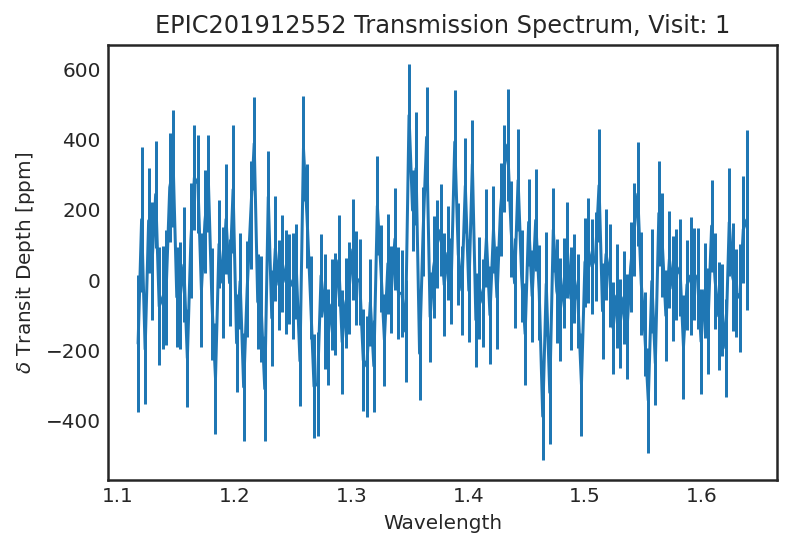

In [12]:
om.Spectra([visit.transmission_spectrum for visit in obs]).flatten().bin(bins=np.linspace(0.8, 1.7, 300)).plot()

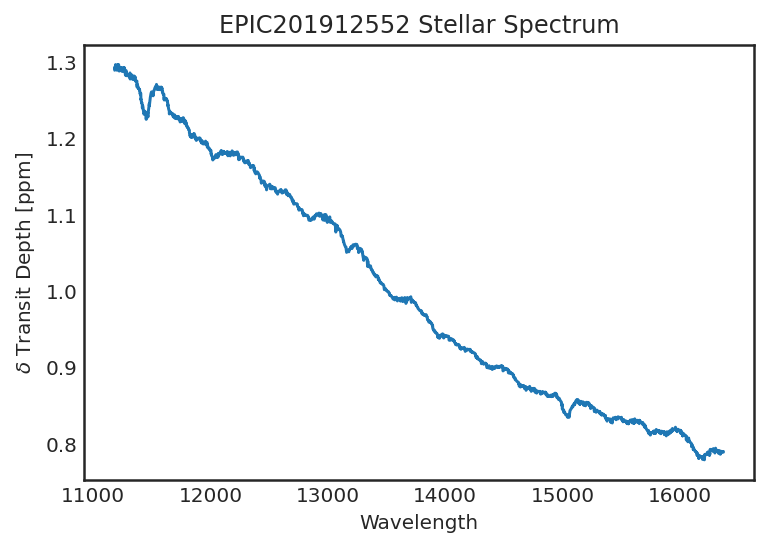

In [13]:
spec = obs.stellar_spectra
spec.plot()
spec.hdulist.writeto(f'results/{name}_stellar_spectrum.fits', overwrite=True)

In [14]:
from astropy.io import fits
try:
    hdulist = om.Spectra([visit.transmission_spectrum for visit in obs if visit.transmission_spectrum.spec.sum() != 0]).hdulist
    hdulist.writeto(f'results/{name}_transmission.fits', overwrite=True)
except:
    pass
try:    
    hdulist = om.Spectra([visit.emission_spectrum for visit in obs if visit.emission_spectrum.spec.sum() != 0]).hdulist
    hdulist.writeto(f'results/{name}_emission.fits', overwrite=True)
except:
    pass

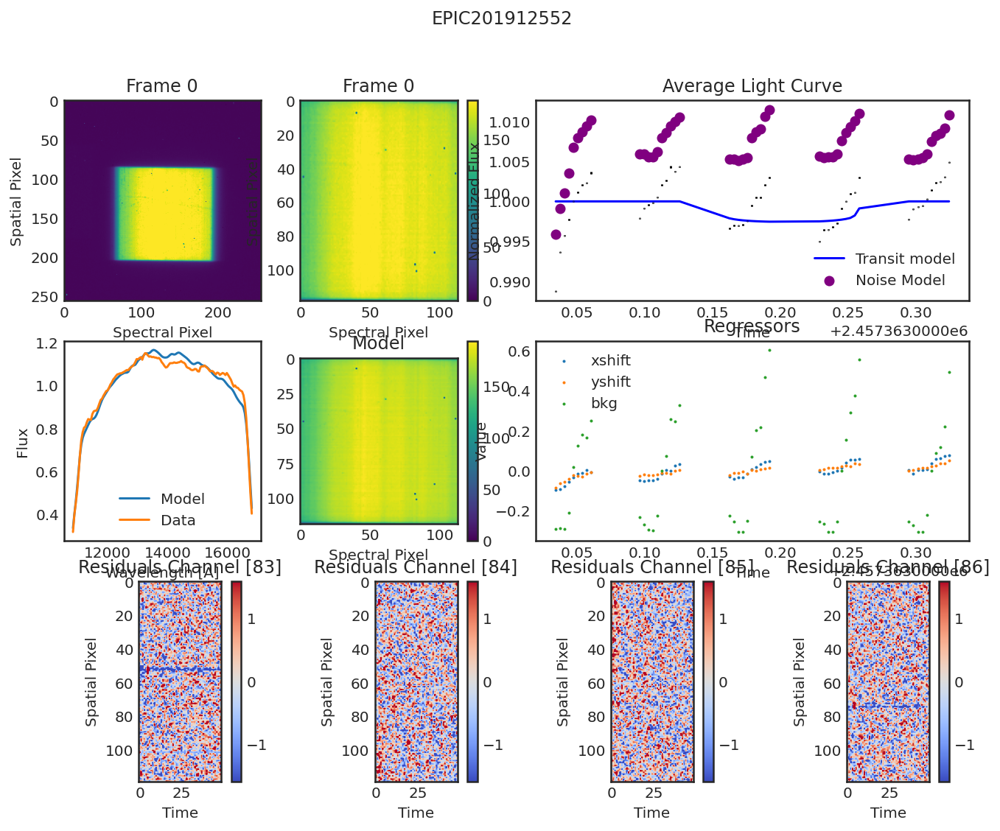

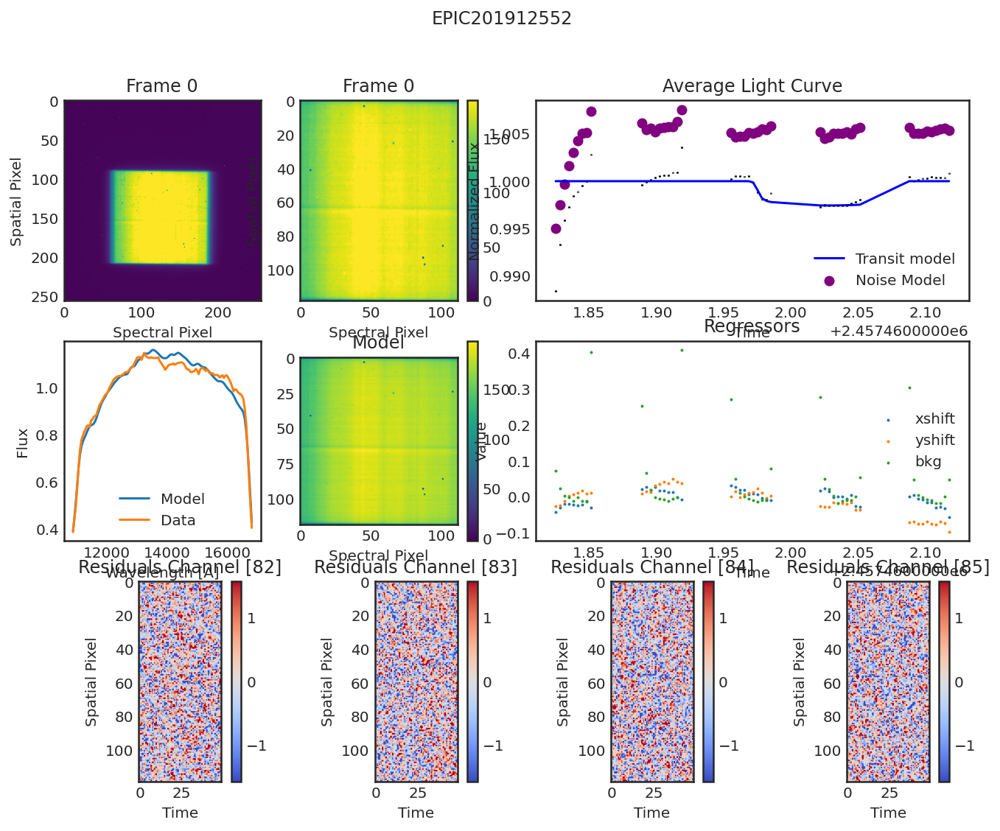

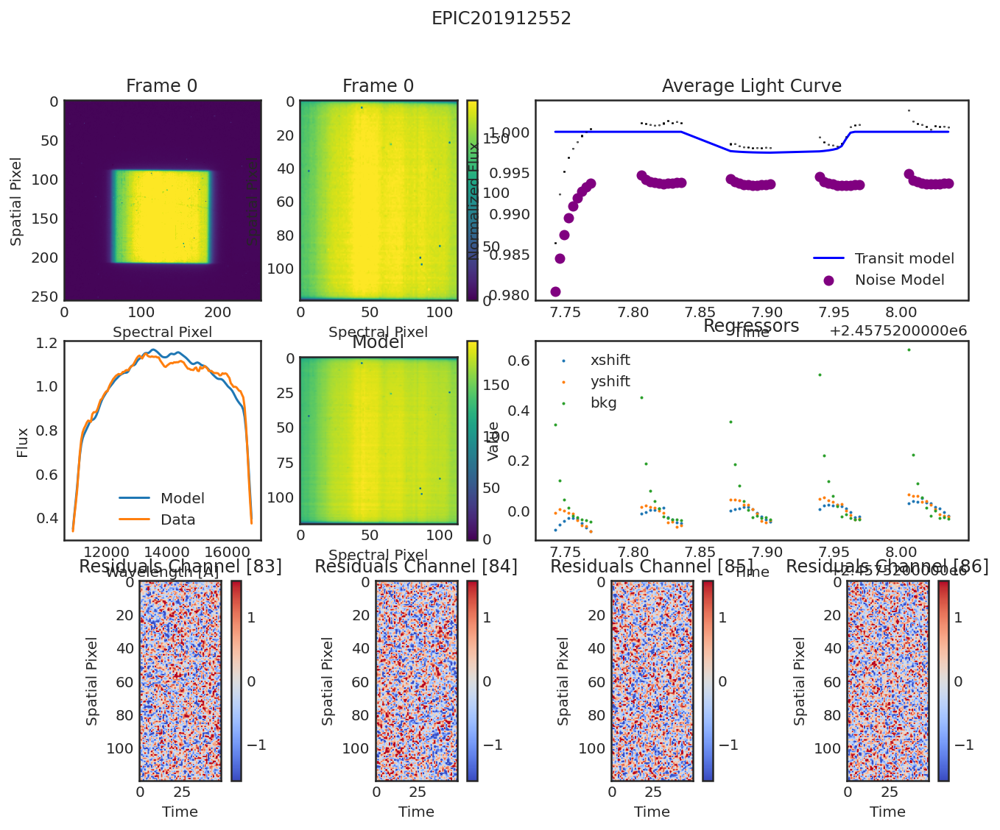

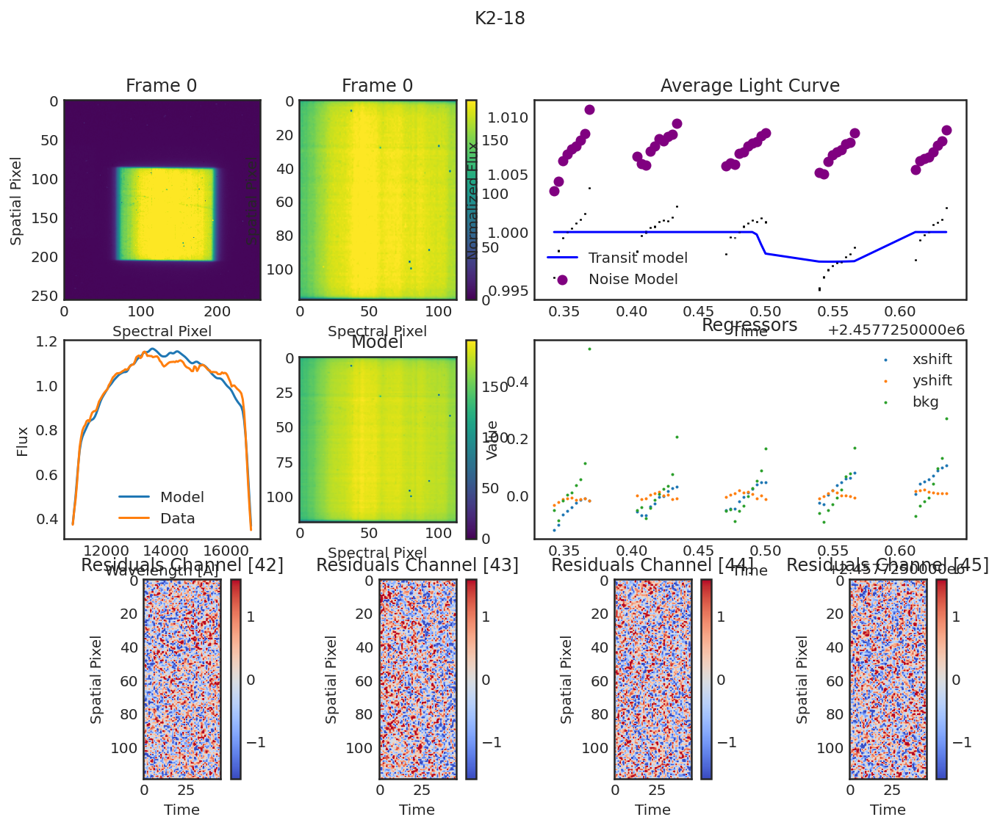

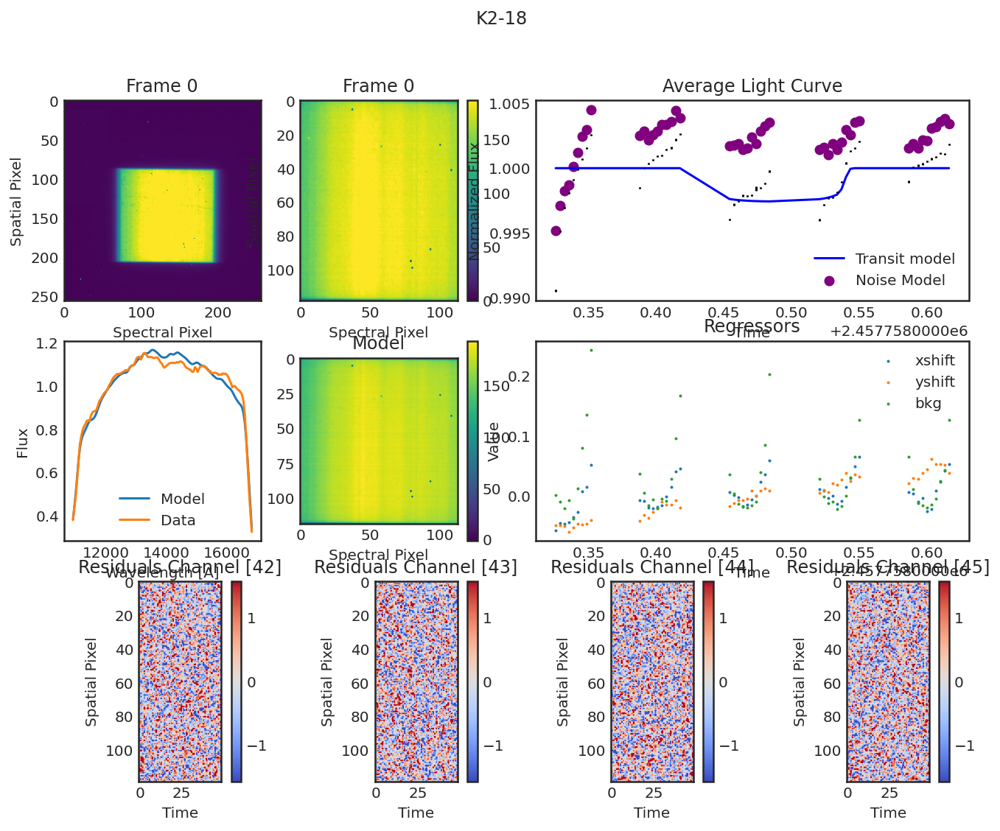

...

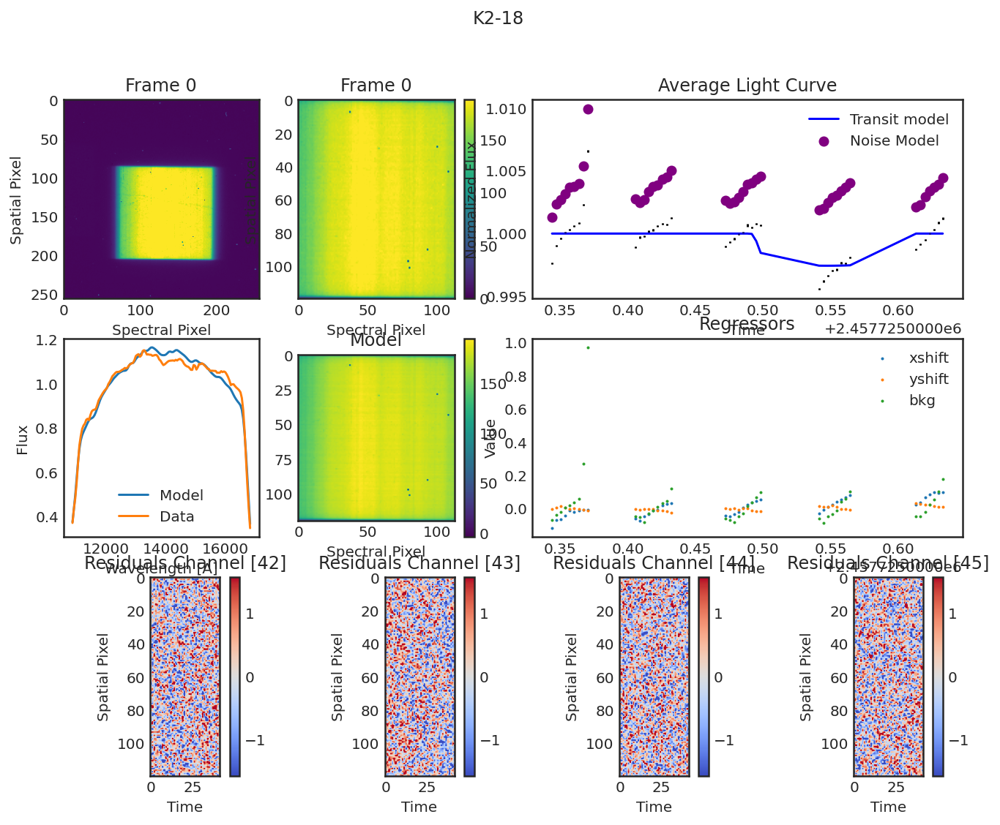

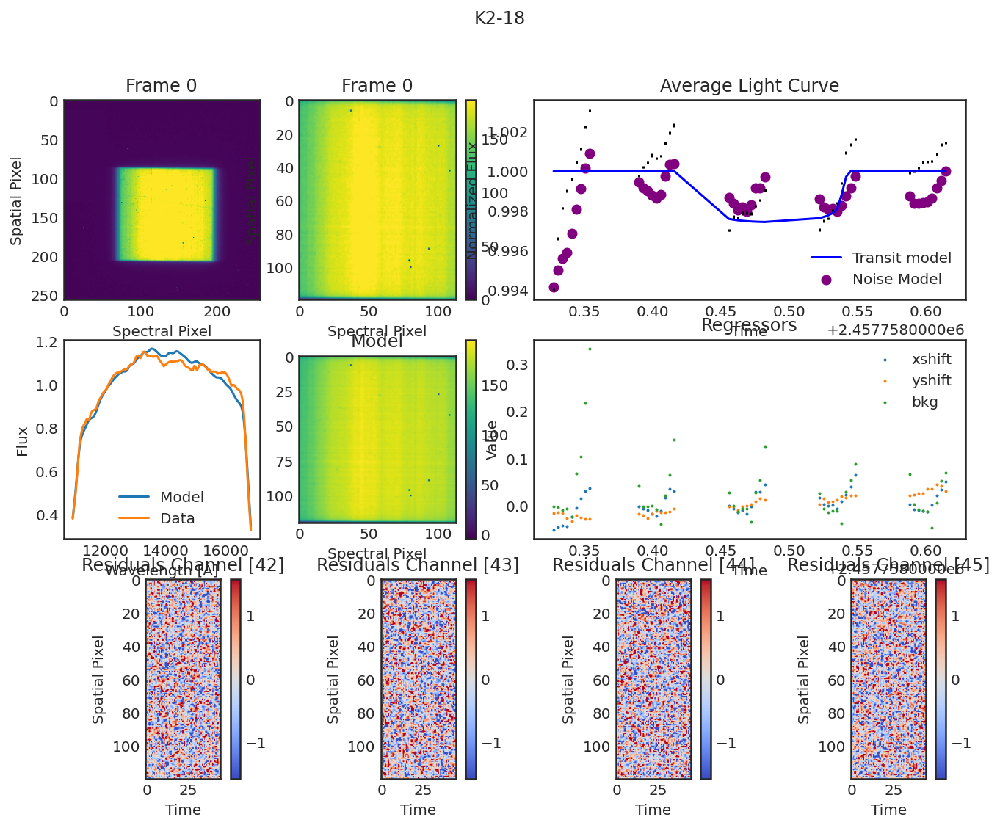

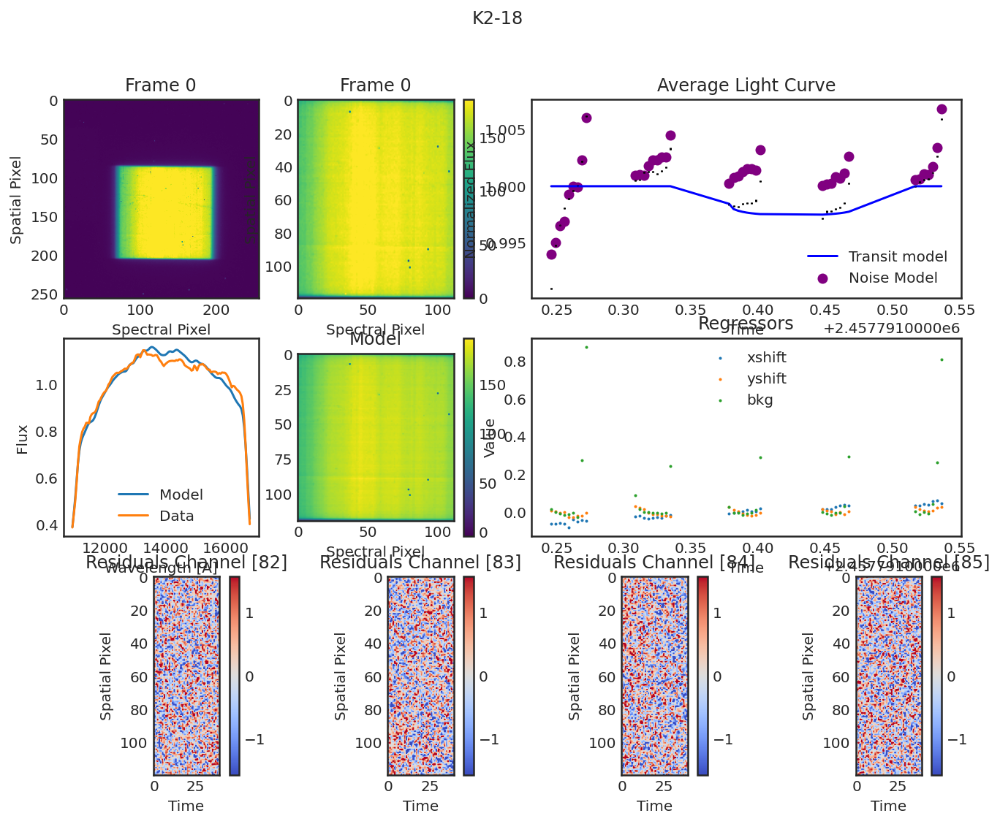

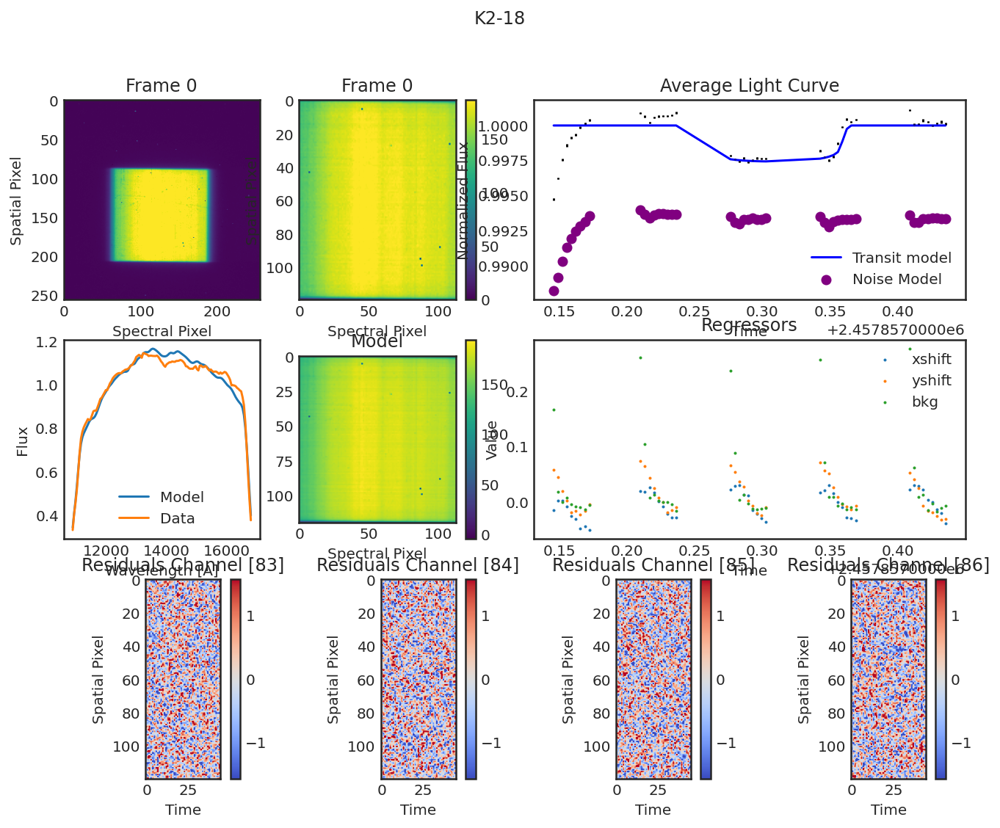

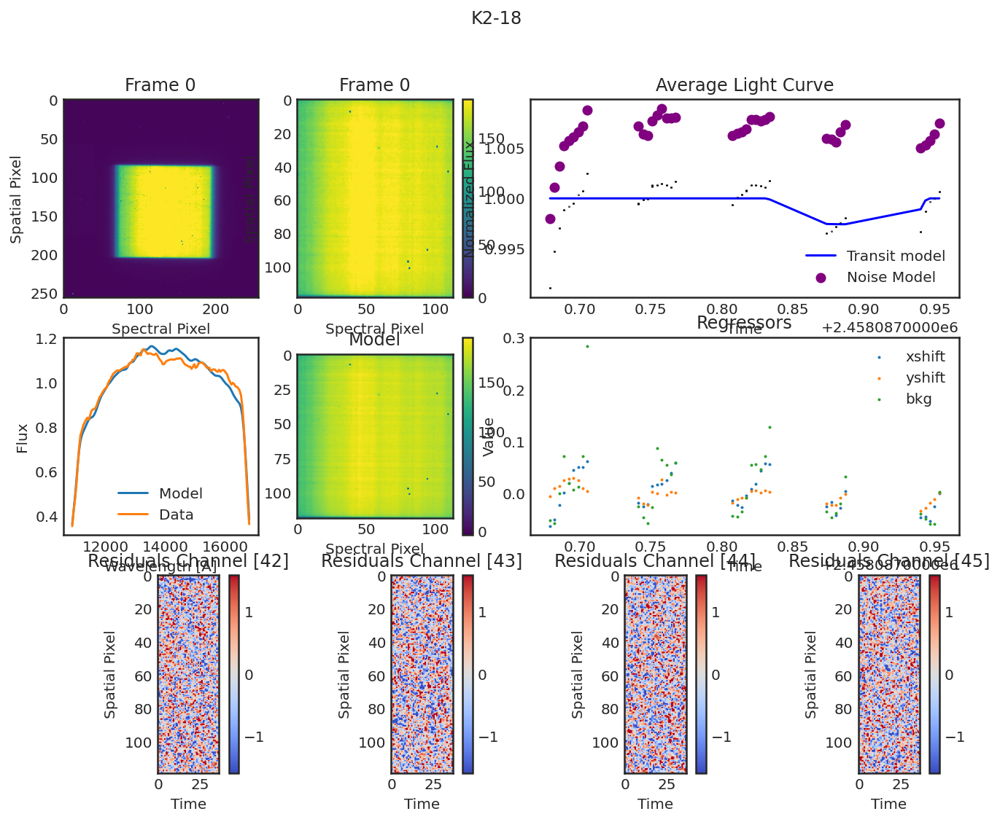

In [15]:
for visit in obs:
    visit.diagnose();
    plt.show();